# Store Item Demand Forecasting

#### Given 5 years of store-item sales data.
#### Goal is to predict 3 months of sales for 50 different items at 10 different stores.

## Model - SARIMA
### Univariate Multi-step Output

#### Tools: Jupyter Notebooks, pandas, Matplotlib

In [4]:
import types
import warnings
warnings.filterwarnings("ignore")
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.metrics import mean_squared_error
from math import sqrt

from pandas.plotting import autocorrelation_plot

from pylab import rcParams
import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'green'

import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf, adfuller

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX

## Data Set
#### Data Source: https://www.kaggle.com/c/demand-forecasting-kernels-only

#### Load data set

In [6]:
# load dataset
dataset = pd.read_csv("train.csv",parse_dates=['date'])
dataset.head()

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


## Data Quality Assessment

In [7]:
# view data set information
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    913000 non-null  datetime64[ns]
 1   store   913000 non-null  int64         
 2   item    913000 non-null  int64         
 3   sales   913000 non-null  int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 27.9 MB


In [8]:
# training data set size
print("Training data set size: %s" %dataset.size)

Training data set size: 3652000


In [9]:
# describe train data
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
store,913000.0,5.500000,2.872283,1.0,3.0,5.5,8.0,10.0
item,913000.0,25.500000,14.430878,1.0,13.0,25.5,38.0,50.0
sales,913000.0,52.250287,28.801144,0.0,30.0,47.0,70.0,231.0


In [10]:
# explore train data types
dataset.dtypes

date     datetime64[ns]
store             int64
item              int64
sales             int64
dtype: object

In [11]:
# time period of data set
print('Min date of training data set: %s' % dataset['date'].min().date())
print('Max date of training data set: %s' % dataset['date'].max().date())

Min date of training data set: 2013-01-01
Max date of training data set: 2017-12-31


### Initial data exploration

In [12]:
# total daily sales
total_daily_sales = dataset.groupby('date', as_index=False)['sales'].sum()

# store daily sales
store_daily_sales = dataset.groupby(['store', 'date'], as_index=False)['sales'].sum()

# item daily sales
item_daily_sales = dataset.groupby(['item', 'date'], as_index=False)['sales'].sum()

<AxesSubplot:xlabel='date'>

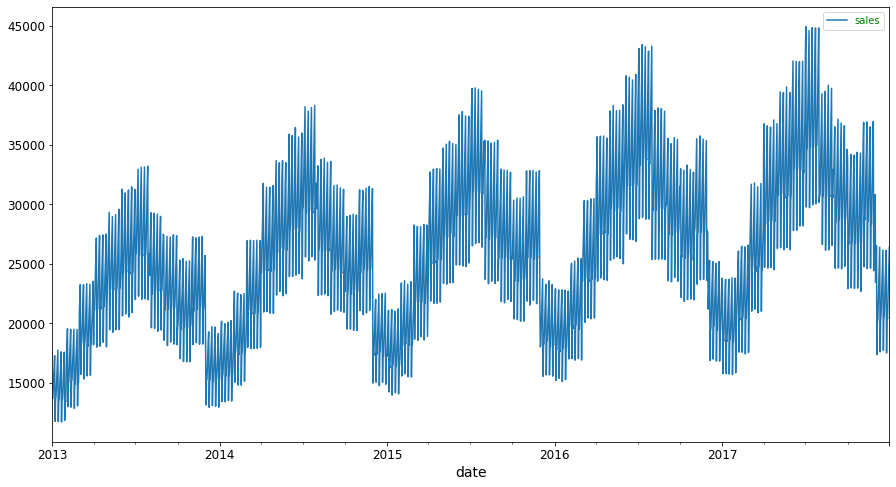

In [13]:
# Visualise total daily sales
total_daily_sales[['date','sales']].plot('date', figsize=(15,8))

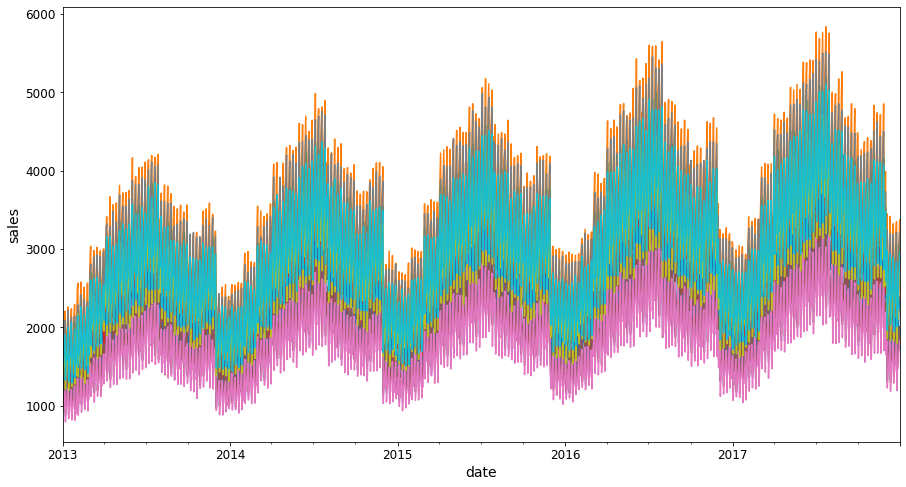

In [15]:
# Visualise store daily sales

# create stacked line plots of store dialy sales
fig, axs = plt.subplots(figsize=(15, 8))
for store in store_daily_sales['store'].unique():
    current_store_daily_sales = store_daily_sales[(store_daily_sales['store'] == store)]
    #current_store_daily_sales[['date','sales']].plot('date', figsize=(15,15))
    current_store_daily_sales[['date','sales']].plot('date', ax=axs, legend=False)
plt.ylabel("sales")    
plt.show()

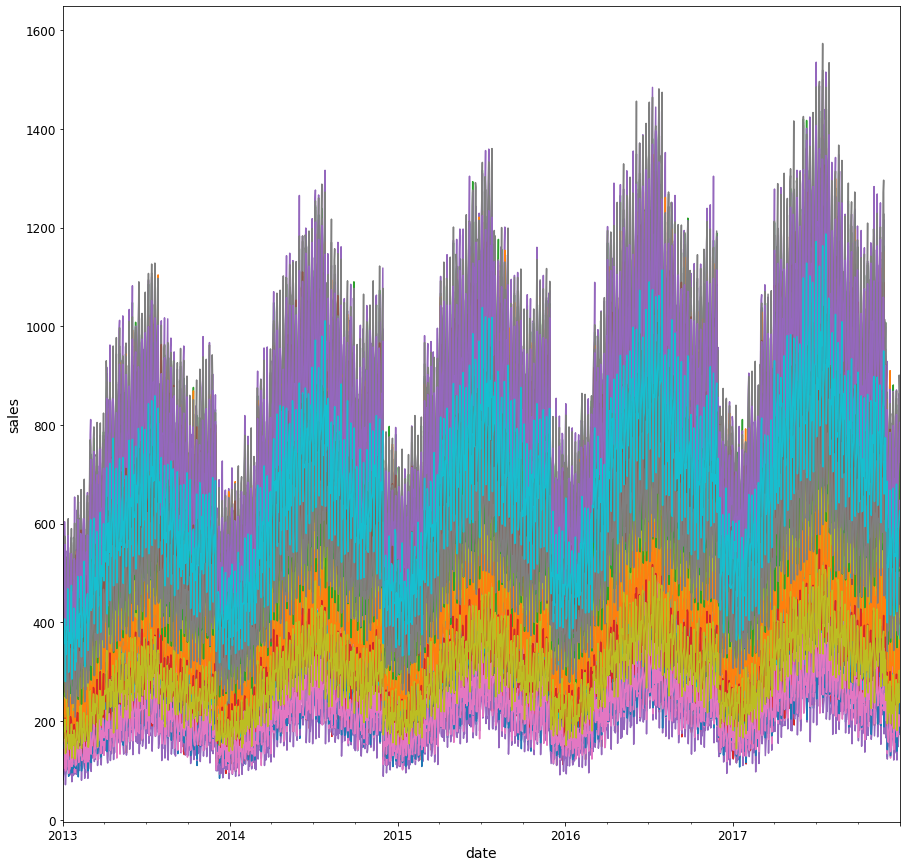

In [16]:
# Visualise item daily sales
# create stacked line plots of item dialy sales
fig, axs = plt.subplots(figsize=(15, 15))
for item in item_daily_sales['item'].unique():
    current_item_daily_sales = item_daily_sales[(item_daily_sales['item'] == item)]
    current_item_daily_sales[['date','sales']].plot('date', ax=axs, legend=False)
plt.ylabel("sales")    
plt.show()

In [17]:
# Visualise total monthly sales
monthly_sales = total_daily_sales.resample('M', on = 'date').sum()
monthly_sales.head()

,sales
date,
2013-01-31,454904
2013-02-28,459417
2013-03-31,617382
2013-04-30,682274
2013-05-31,763242


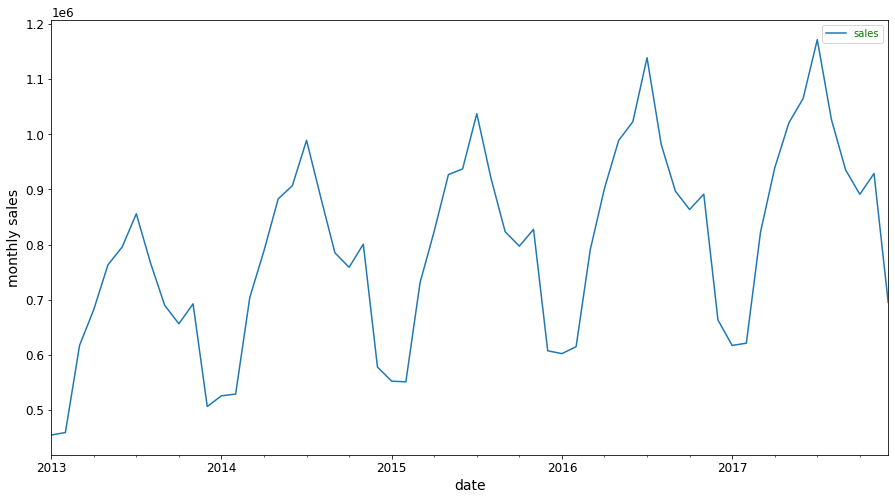

In [18]:
# plot monthly sales
monthly_sales.plot(figsize=(15,8))
plt.ylabel("monthly sales")    
plt.show()

Initial data exploration summary
data set size: 3,652,000
data fields:
date - Date of the sale data. There are no holiday effects or store closures.
store - Store ID
item - Item ID
sales - Number of units of an Item sold at a particular store on a particular date.
data set time period:2013-01-01 to 2017-12-31 (5 years)

### Transform the data

##### As the sales filed indicated number of items sold at a particular store on a particular date, 
##### the forecast has to be at item level.
##### Forecasting daily sales of items at store level would require modelling 500 time series.
##### Forecasting daily sales of items aggregated acros all the stores require modelling 50 time series
#### The same methodlogy can be applied to forecast sales of 50 items at store level  as it requires modelling 50 time series at store level irrespective of whether the sales are 
#### aggregated across all stores or not
#### Therefore the item sales aggregated across all 10 stores has been modelled for this capstone project.

### Data Transformation - Check for Missing Values

In [19]:
# Check if there are any missing values across each column
print('Missing values across each column:')
print(dataset.isnull().any())
print('Count of mising values in the entire dataset: %d' %dataset.isnull().sum().sum())

Missing values across each column:
date     False
store    False
item     False
sales    False
dtype: bool
Count of mising values in the entire dataset: 0


In [21]:
# create pivot table of dataset to get total daily sales by item across all stores
table = pd.pivot_table(dataset, values='sales', index=['date'],
                    columns=['item'], aggfunc=np.sum)

table.head()

item,1,2,3,4,5,6,7,8,9,10,...,41,42,43,44,45,46,47,48,49,50
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,133,327,172,102,83,288,278,416,245,378,...,103,195,253,154,396,319,116,277,159,330
2013-01-02,99,279,213,110,81,310,291,386,225,397,...,132,215,255,165,393,316,118,281,159,384
2013-01-03,127,304,193,112,96,309,324,398,265,388,...,131,215,306,170,459,325,104,280,187,356
2013-01-04,145,359,218,138,108,343,335,430,313,462,...,122,224,323,189,450,351,128,296,184,394
2013-01-05,149,377,217,144,100,343,377,481,319,449,...,142,243,309,202,533,360,133,344,179,407


In [22]:
# table size
table.size

91300

In [23]:
# check table index
table.index

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2017-12-22', '2017-12-23', '2017-12-24', '2017-12-25',
               '2017-12-26', '2017-12-27', '2017-12-28', '2017-12-29',
               '2017-12-30', '2017-12-31'],
              dtype='datetime64[ns]', name='date', length=1826, freq=None)

### Data Exploration - Correlation between Item Sales

In [24]:
# Correlation matrix
table.corr(method='pearson')

item,1,2,3,4,5,6,7,8,9,10,...,41,42,43,44,45,46,47,48,49,50
item,,,,,,,,,,,,,,,,,,,,,
1,1.000000,0.949817,0.943982,0.931111,0.928253,0.951033,0.953263,0.955331,0.949106,0.952654,...,0.931826,0.945771,0.947973,0.938376,0.955409,0.951722,0.929574,0.948469,0.940014,0.954034
2,0.949817,1.000000,0.962950,0.951112,0.946348,0.970675,0.972013,0.975112,0.970677,0.975398,...,0.952011,0.965880,0.971355,0.957552,0.976030,0.971945,0.954465,0.971315,0.959498,0.972290
3,0.943982,0.962950,1.000000,0.943553,0.938912,0.965703,0.964766,0.968444,0.964912,0.966929,...,0.946561,0.959597,0.962945,0.951927,0.969374,0.965429,0.945340,0.965757,0.954254,0.965208
4,0.931111,0.951112,0.943553,1.000000,0.924113,0.951426,0.951495,0.955546,0.950944,0.955309,...,0.933445,0.944225,0.950223,0.938294,0.954837,0.950589,0.929665,0.951645,0.939384,0.953780
5,0.928253,0.946348,0.938912,0.924113,1.000000,0.946254,0.947877,0.950927,0.942884,0.947149,...,0.930291,0.940223,0.943209,0.931923,0.949157,0.946226,0.927260,0.946468,0.932469,0.949067
6,0.951033,0.970675,0.965703,0.951426,0.946254,1.000000,0.972633,0.975353,0.971682,0.974652,...,0.950970,0.966930,0.968192,0.959568,0.975768,0.972271,0.952978,0.971011,0.959370,0.974042
7,0.953263,0.972013,0.964766,0.951495,0.947877,0.972633,1.000000,0.976720,0.970536,0.976454,...,0.952153,0.967664,0.969441,0.957992,0.977044,0.973428,0.950723,0.971594,0.958244,0.973746
8,0.955331,0.975112,0.968444,0.955546,0.950927,0.975353,0.976720,1.000000,0.974452,0.978334,...,0.956229,0.970900,0.974090,0.962441,0.980554,0.975325,0.955526,0.975824,0.962517,0.976540
9,0.949106,0.970677,0.964912,0.950944,0.942884,0.971682,0.970536,0.974452,1.000000,0.973914,...,0.949523,0.963543,0.968743,0.956747,0.975038,0.970400,0.949025,0.969829,0.957673,0.970754


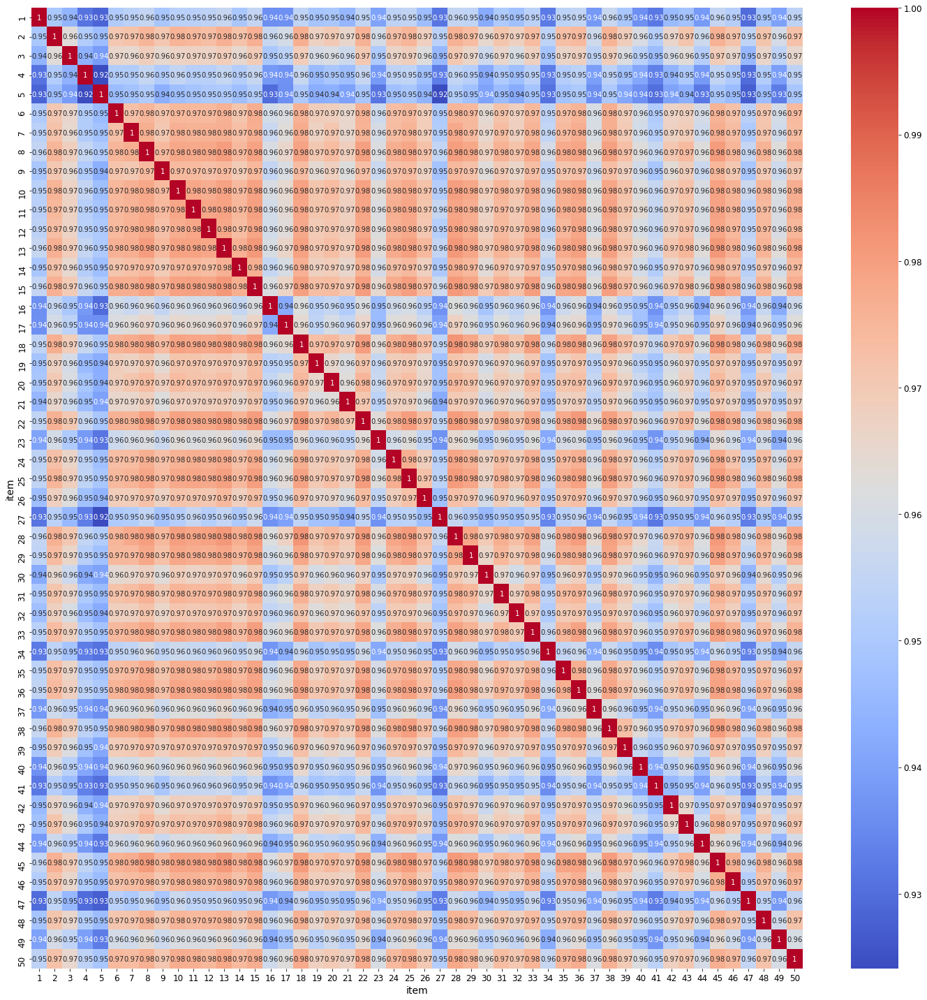

In [27]:
# Correlation heatmap
import seaborn as sns
fig_dims = (20, 20)
fig, ax = plt.subplots(figsize=fig_dims)
sns.heatmap(table.corr(), annot = True, fmt='.2g',cmap= 'coolwarm', ax=ax)
plt.tight_layout()
fig.savefig('heatmap.png')

### Data Visualisation - Value Distribution of Item Sales

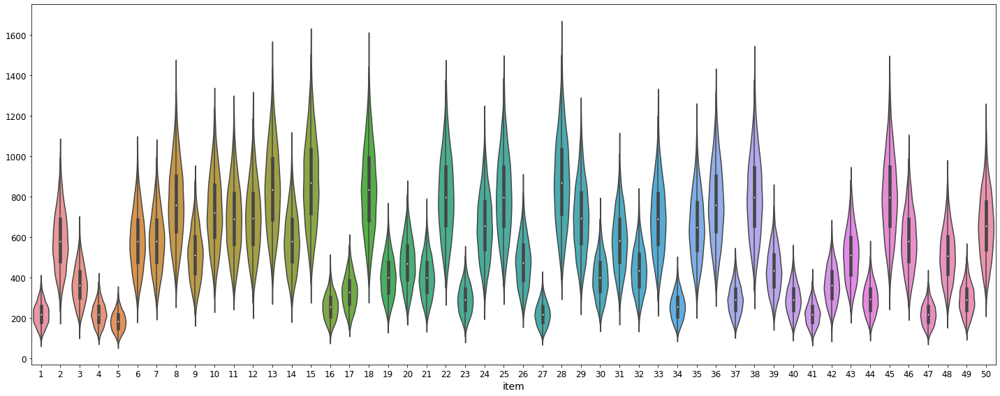

In [29]:
# violin plots
fig_dims = (20, 8)
fig, ax = plt.subplots(figsize=fig_dims)
ax = sns.violinplot(data=table, scale="width")
plt.tight_layout()
fig.savefig('violinplot.png')

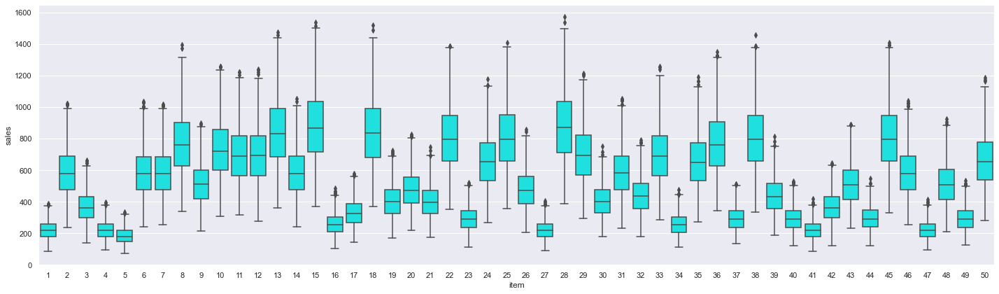

In [32]:
# box plot
# melt dataframe to convert the data long form
df_long = table.melt(var_name='item',value_name='sales')

fig = plt.figure(figsize=(20,6))
sns.set()
ax = sns.boxplot(y="sales", x="item", data=df_long, color='cyan')
plt.tight_layout()
fig.savefig('boxplot.png')

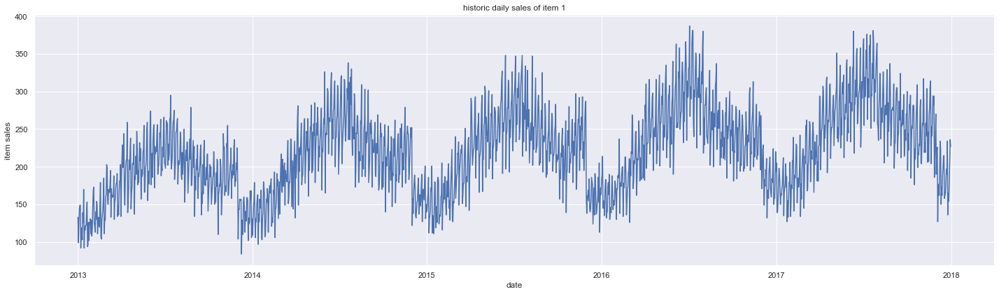

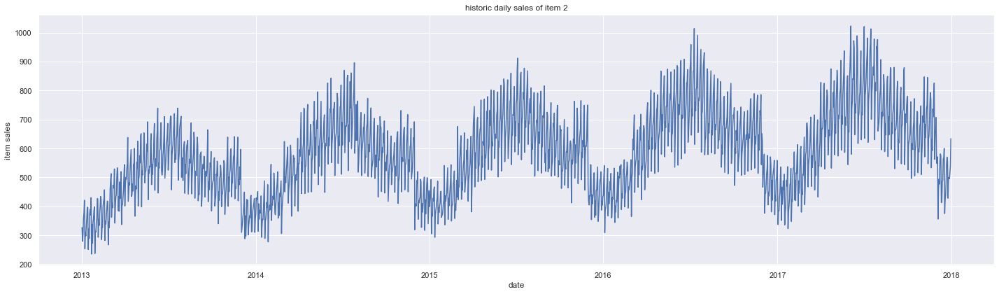

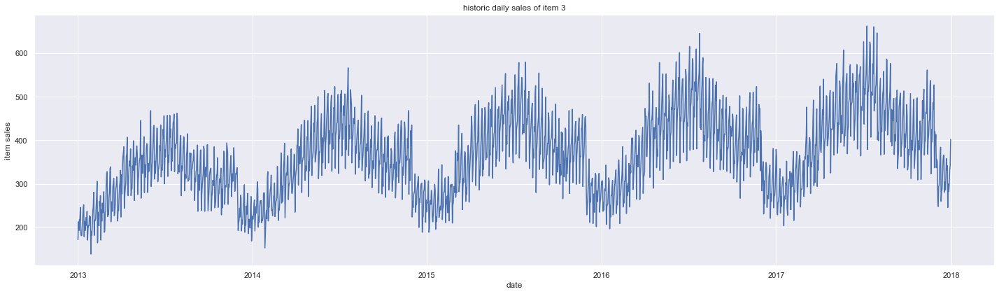

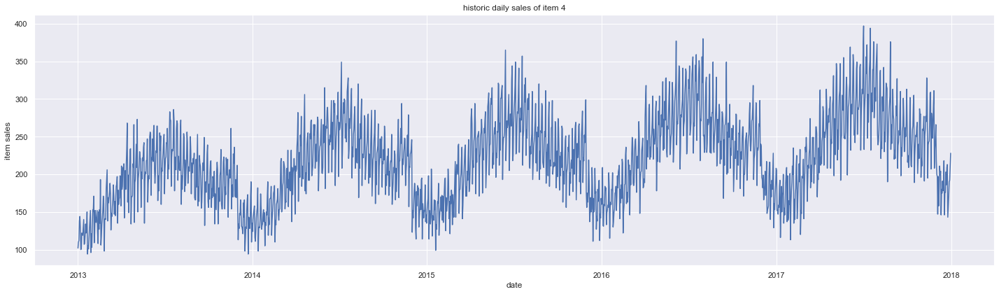

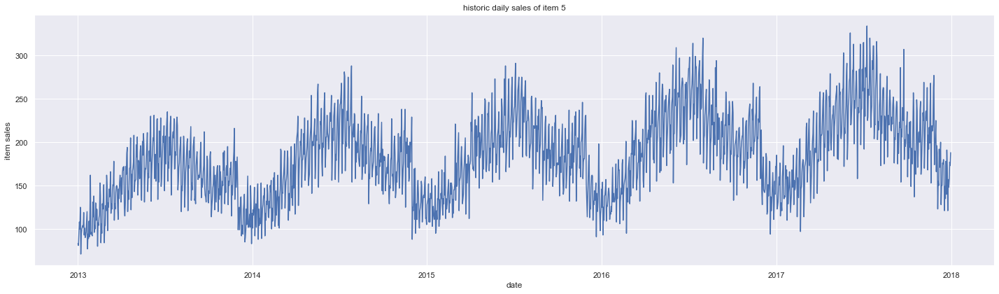

...

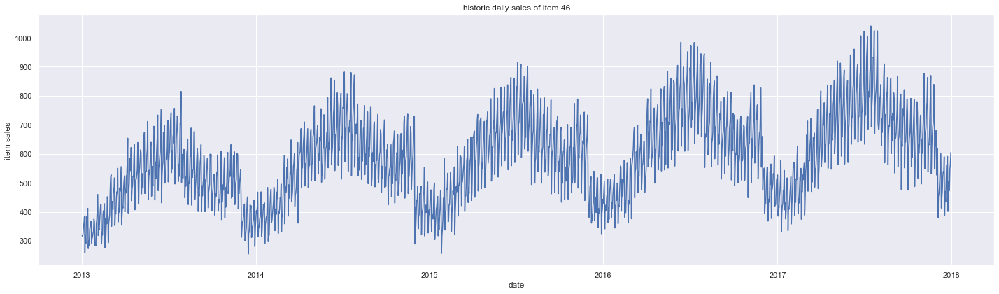

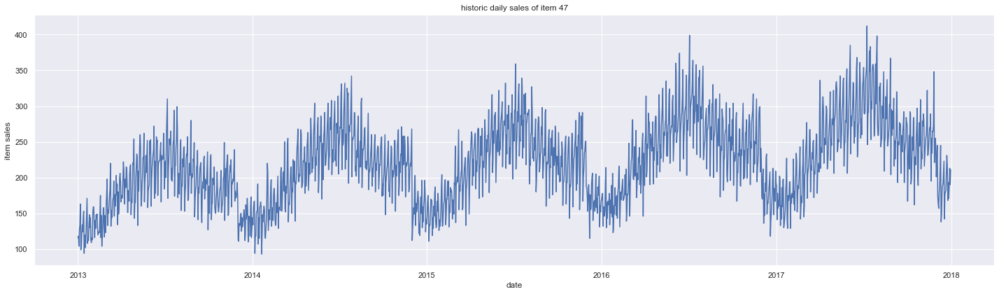

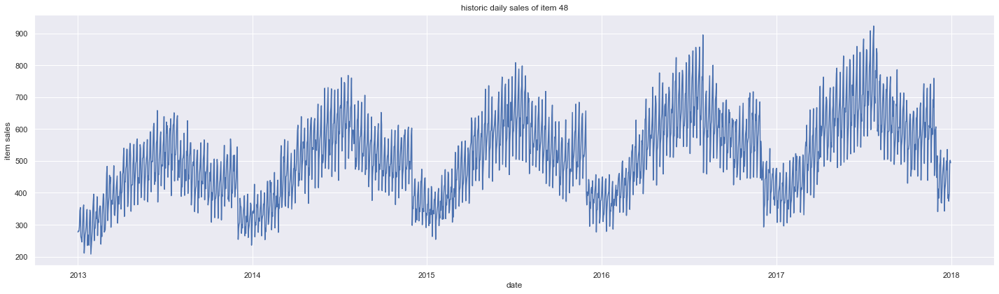

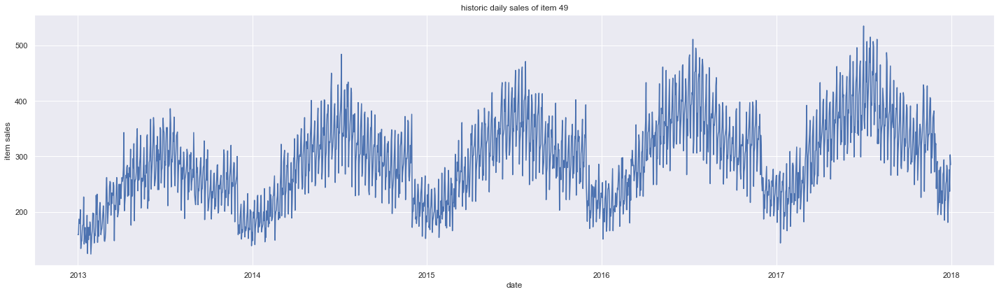

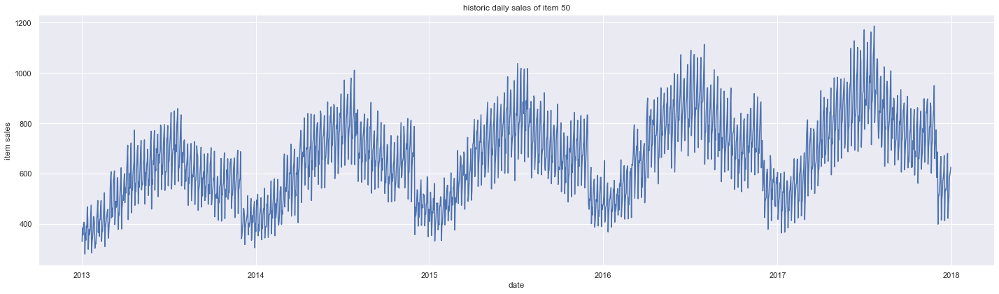

In [33]:
# plot historic daily sales of items

for c in table.columns:
    fig = plt.figure(figsize=(20,6))
    plt.plot(table[c])
    plt.xlabel('date')
    plt.ylabel('item sales')
    plt.title('historic daily sales of item %s'%c)
    plt.tight_layout()
    plt.show()
    fig.savefig('lineplot_item-%s'%c+'.png')

In [37]:
# save transformed data sets
table.to_csv("itemsales.csv",index=True, header = True)

## Load transformed dataset

In [38]:
# load data
itemsales = pd.read_csv("itemsales.csv", header = 0)
itemsales ['date'] = pd.to_datetime(itemsales['date'])
itemsales.set_index('date', inplace=True)
itemsales.head()

,1,2,3,4,5,6,7,8,9,10,...,41,42,43,44,45,46,47,48,49,50
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,133,327,172,102,83,288,278,416,245,378,...,103,195,253,154,396,319,116,277,159,330
2013-01-02,99,279,213,110,81,310,291,386,225,397,...,132,215,255,165,393,316,118,281,159,384
2013-01-03,127,304,193,112,96,309,324,398,265,388,...,131,215,306,170,459,325,104,280,187,356
2013-01-04,145,359,218,138,108,343,335,430,313,462,...,122,224,323,189,450,351,128,296,184,394
2013-01-05,149,377,217,144,100,343,377,481,319,449,...,142,243,309,202,533,360,133,344,179,407


In [39]:
# train-test split
print(len(itemsales))
train,test = itemsales[:-92],itemsales[-92:]
print(train.shape)
print(test.shape)

1826
(1734, 50)
(92, 50)


### Persistence
#### establish a baseline of performance

In [40]:
# model each item individually

# create dataframes to store RMSE & Forecasts of each item
items_rmse_pers = []
df_pred_pers = pd.DataFrame()
items = []
# loop over all items
for c in train.columns:
    items.append(c)
    train_series = train[c]
    test_series = test[c]

    # prepare data
    y_train= train_series.values
    y_train = y_train.astype('float32')

    y_test= test_series.values
    y_test = y_test.astype('float32')
    
    # walk-forward validation
    history = [y for y in y_train]
    predictions = list()
    for i in range(len(y_test)):

        # predict
        yhat = history[-1]
        predictions.append(yhat)
        # observation
        obs = y_test[i]
        history.append(obs)
        #print('>Predicted=%.3f, Expected=%3.f' % (yhat, obs))

    # report performance by item
    rmse_pers_item = sqrt(mean_squared_error(y_test, predictions))
    print('RMSE_Item %s: %.3f' %(c,rmse_pers_item))
    items_rmse_pers.append(rmse_pers_item)
    df_pred_pers[c] = predictions

df_rmse_pers = pd.DataFrame(columns=['rmse_pers'])
df_rmse_pers['rmse_pers'] = items_rmse_pers
    
df_rmse_pers['item'] = items
    
print(df_rmse_pers.head())
    
df_pred_pers['date'] = test.index
df_pred_pers.set_index('date',inplace = True)
print(df_pred_pers.head())

# report performance across all items
rmse_pers = sqrt(mean_squared_error(test, df_pred_pers))
print('RMSE Persistance: %.3f' %rmse_pers)

# save predictions & rmse
df_rmse_pers.to_csv('df_rmse_pers.csv', header=True)
df_pred_pers.to_csv('df_pred_pers.csv', header=True)

#project.save_data(file_name = 'df_rmse_pers.csv',data =df_rmse_pers.to_csv(header=True), overwrite = True)
#project.save_data(file_name = 'df_pred_pers.csv',data =df_pred_pers.to_csv(header=True), overwrite = True)

RMSE_Item 1: 44.261
RMSE_Item 2: 104.709
RMSE_Item 3: 68.965
RMSE_Item 4: 39.240
RMSE_Item 5: 40.208
RMSE_Item 6: 110.078
RMSE_Item 7: 103.841
RMSE_Item 8: 143.135
RMSE_Item 9: 98.912
RMSE_Item 10: 126.557
RMSE_Item 11: 134.388
RMSE_Item 12: 128.370
RMSE_Item 13: 165.207
RMSE_Item 14: 97.926
RMSE_Item 15: 163.648
RMSE_Item 16: 54.050
RMSE_Item 17: 64.890
RMSE_Item 18: 153.024
RMSE_Item 19: 76.476
RMSE_Item 20: 87.523
RMSE_Item 21: 73.353
RMSE_Item 22: 150.930
RMSE_Item 23: 58.293
RMSE_Item 24: 120.822
RMSE_Item 25: 157.992
RMSE_Item 26: 89.800
RMSE_Item 27: 41.189
RMSE_Item 28: 154.079
RMSE_Item 29: 129.204
RMSE_Item 30: 79.351
RMSE_Item 31: 103.597
RMSE_Item 32: 94.057
RMSE_Item 33: 134.238
RMSE_Item 34: 51.618
RMSE_Item 35: 118.984
RMSE_Item 36: 143.813
RMSE_Item 37: 58.612
RMSE_Item 38: 142.471
RMSE_Item 39: 80.623
RMSE_Item 40: 54.161
RMSE_Item 41: 44.952
RMSE_Item 42: 70.933
RMSE_Item 43: 96.894
RMSE_Item 44: 56.367
RMSE_Item 45: 150.299
RMSE_Item 46: 114.533
RMSE_Item 47: 44.070


### Data Analysis


#### Summary Statistics

In [41]:
print(itemsales.describe())

                 1            2            3            4            5  \
count  1826.000000  1826.000000  1826.000000  1826.000000  1826.000000   
mean    219.815991   585.741512   366.422234   220.102410   183.587076   
std      56.385329   144.684855    92.004531    55.893607    47.440545   
min      84.000000   235.000000   139.000000    94.000000    71.000000   
25%     178.000000   478.000000   298.000000   179.000000   148.000000   
50%     218.000000   578.000000   362.500000   218.000000   181.000000   
75%     258.000000   688.000000   432.000000   259.000000   217.750000   
max     387.000000  1023.000000   662.000000   397.000000   334.000000   

                 6            7            8            9           10  ...  \
count  1826.000000  1826.000000  1826.000000  1826.000000  1826.000000  ...   
mean    585.038883   585.310515   769.500548   513.898686   732.274370  ...   
std     146.356911   145.737924   191.915059   127.718274   181.603768  ...   
min     242.00000

#### Line Plot

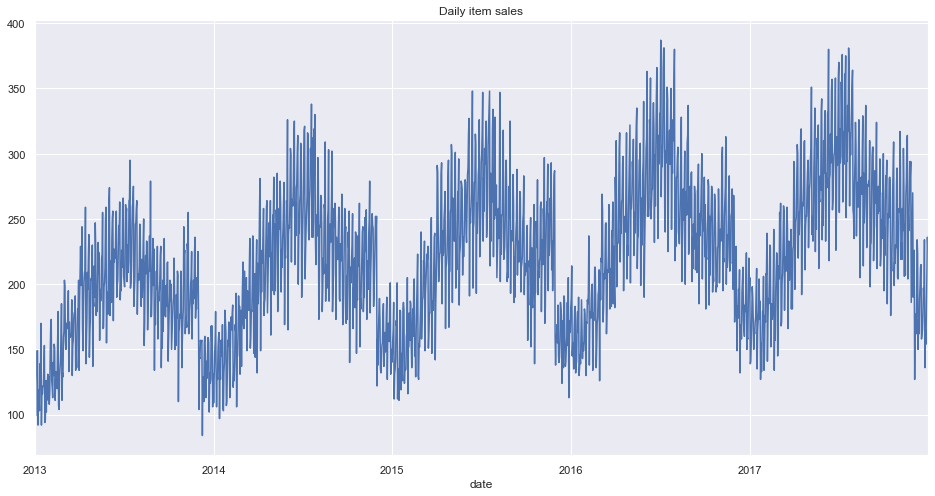

In [42]:
# plot daily item sales of item 1 only
itemsales['1'].plot(figsize=(16,8),title = 'Daily item sales');
plt.ticklabel_format(style='plain',axis = 'y')

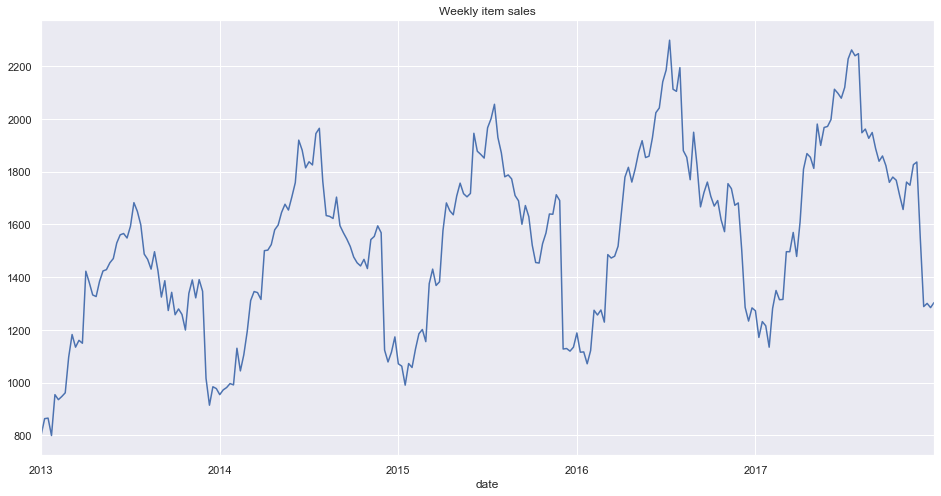

In [43]:
# plot weekly item sales of item 1 only
itemsales['1'].groupby(pd.Grouper(freq="W")).sum().plot(figsize=(16,8),title = 'Weekly item sales');
plt.ticklabel_format(style='plain',axis = 'y')

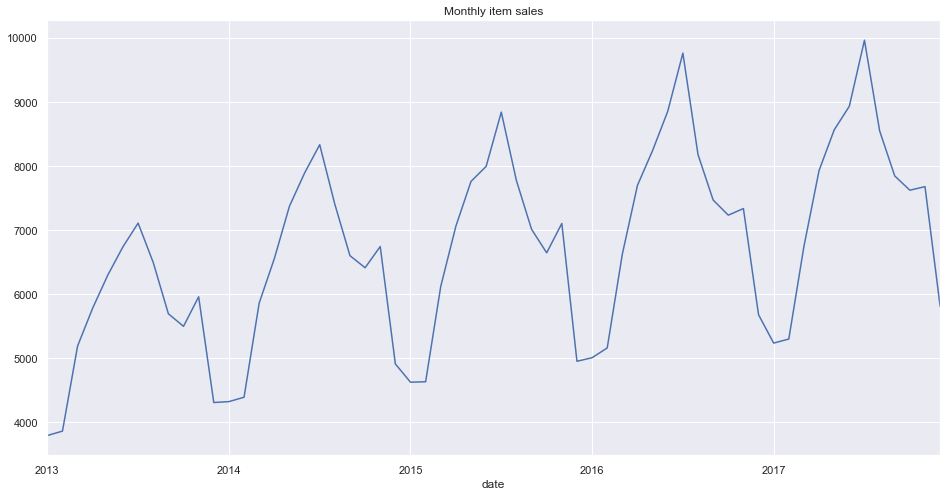

In [44]:
# plot monthly item sales of item 1 only
itemsales['1'].groupby(pd.Grouper(freq="M")).sum().plot(figsize=(16,8),title = 'Monthly item sales');
plt.ticklabel_format(style='plain',axis = 'y')

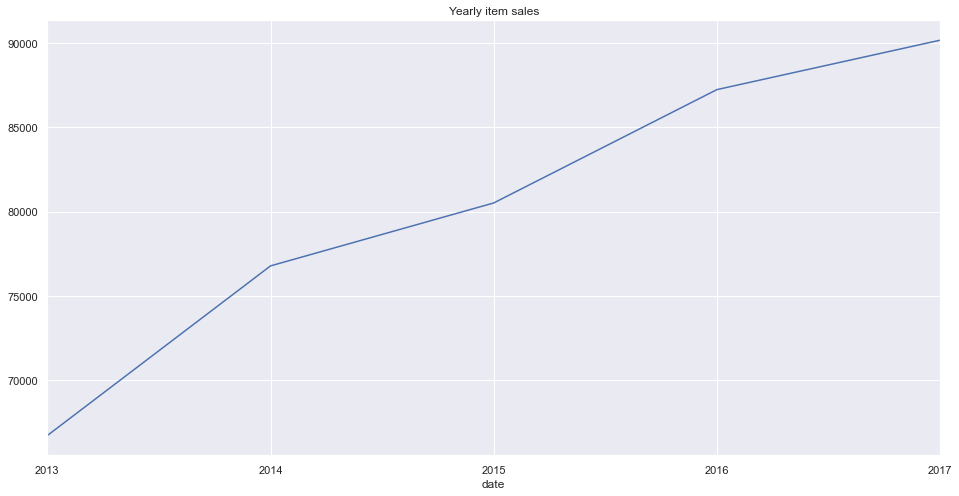

In [45]:
# plot yearly item sales
itemsales['1'].groupby(pd.Grouper(freq="A")).sum().plot(figsize=(16,8),title = 'Yearly item sales');
plt.ticklabel_format(style='plain',axis = 'y')

#### check for stationarity using Augmented Dickey-Fuller test

##### p-value > 0.05: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
##### p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.

In [46]:
# calculate stationarity test of time series data of Item 1
Y = itemsales['1'].values
result = adfuller(Y)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -3.051073
p-value: 0.030392
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568


#### Decompose the time series

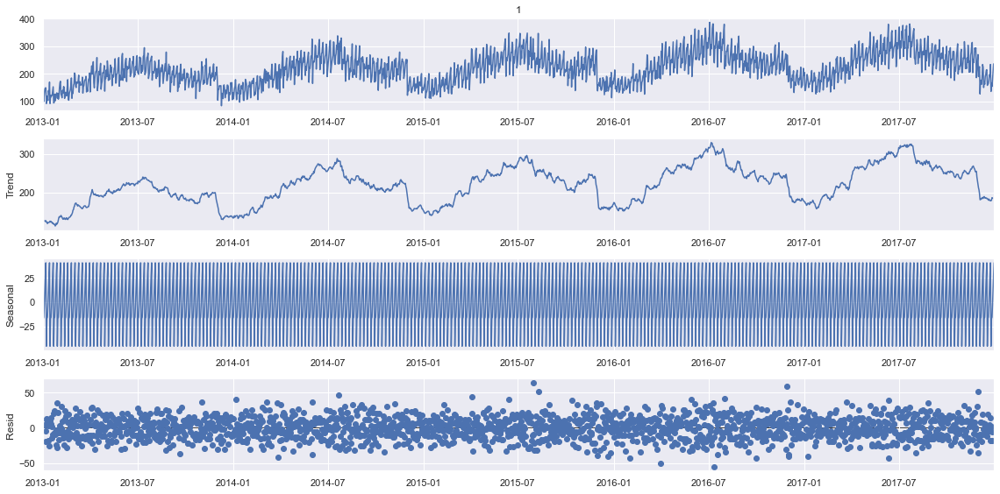

In [47]:
y = itemsales['1']
rcParams['figure.figsize'] = 16, 8
decomposition = sm.tsa.seasonal_decompose(y, model='additive')
fig = decomposition.plot()


### SARIMA Model

##### formula: SARIMA(p,d,q)x(P,D,Q,s)

##### The model parameters are:

##### p and seasonal P: indicate number of autoregressive terms (lags of the stationarised series)
##### d and seasonal D: indicate differencing that must be done to stationarise series
##### q and seasonal Q: indicate number of moving average terms (lags of the forecast errors)

##### the lowercase letters indicate the specification for the non-seasonal component
##### the uppercase letters indicate the specification for the seasonal component

##### s: indicates seasonal length in the data (e.g. it is often 4 for quarterly data or 12 for monthly data).

#### SARIMA model parameters - Autocorrelation and Partial Autocorrelation

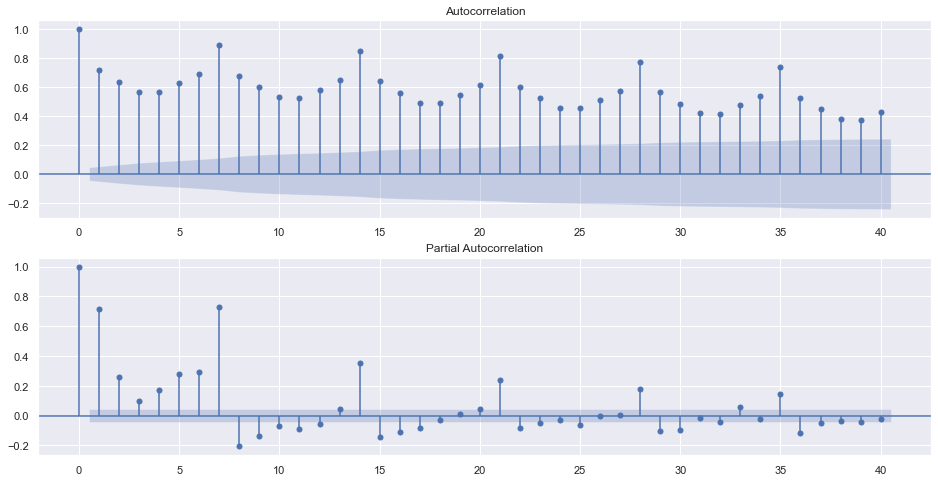

In [48]:
fig, ax = plt.subplots(2,1,figsize=(16, 8))
fig = plot_acf(y, lags=40, ax=ax[0])
fig = plot_pacf(y, lags=40, ax=ax[1])
plt.show()

C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327709
         Iterations: 2
         Function evaluations: 74


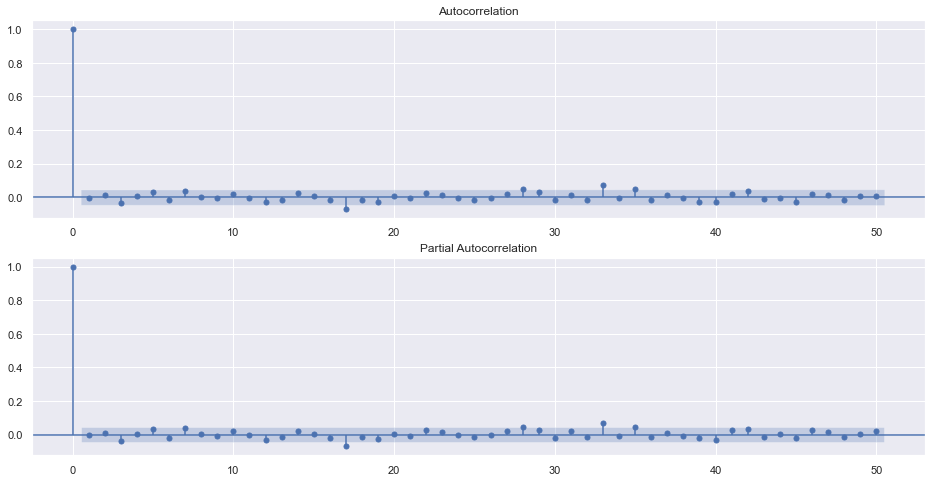

In [49]:
# SARIMAX model definition
model = SARIMAX(y, order=(0,1,1),seasonal_order=(0,1,1,7)).fit(max_iter=50, method='powell')
res = model.resid
fig, ax = plt.subplots(2,1,figsize=(16, 8))
fig = plot_acf(res, lags=50, ax=ax[0])
fig = plot_pacf(res, lags=50, ax=ax[1])
plt.show()


##### There are no significant spikes except for at lag 0. 
##### These parameters are an acceptable starting point for the model and can be further improved using a grid search.


#### SARIMA model parameters - Grid search

C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 5.851308
         Iterations: 3
         Function evaluations: 119
SARIMA(0, 0, 1),(0, 0, 1, 7) - AIC:21374.976898301575


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 5.562302
         Iterations: 4
         Function evaluations: 214
SARIMA(0, 0, 1),(0, 0, 2, 7) - AIC:20321.525415898344


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.501198
         Iterations: 2
         Function evaluations: 70
SARIMA(0, 0, 1),(0, 1, 1, 7) - AIC:16444.374011400236


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.501187
         Iterations: 3
         Function evaluations: 143
SARIMA(0, 0, 1),(0, 1, 2, 7) - AIC:16446.336351590588


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.524822
         Iterations: 4
         Function evaluations: 206
SARIMA(0, 0, 1),(1, 0, 1, 7) - AIC:16532.649965170545


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.524816
         Iterations: 4
         Function evaluations: 251
SARIMA(0, 0, 1),(1, 0, 2, 7) - AIC:16534.62825637953


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.501400
         Iterations: 2
         Function evaluations: 90
SARIMA(0, 0, 1),(1, 1, 1, 7) - AIC:16447.11364402254


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.501197
         Iterations: 3
         Function evaluations: 177
SARIMA(0, 0, 1),(1, 1, 2, 7) - AIC:16448.371834457022


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.525002
         Iterations: 4
         Function evaluations: 248
SARIMA(0, 0, 1),(2, 0, 1, 7) - AIC:16535.308241991675


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.524913
         Iterations: 4
         Function evaluations: 289
SARIMA(0, 0, 1),(2, 0, 2, 7) - AIC:16536.981980985052


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.501333
         Iterations: 2
         Function evaluations: 111
SARIMA(0, 0, 1),(2, 1, 1, 7) - AIC:16448.869009041777


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.500839
         Iterations: 4
         Function evaluations: 278
SARIMA(0, 0, 1),(2, 1, 2, 7) - AIC:16449.06529256523


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 5.596533
         Iterations: 4
         Function evaluations: 216
SARIMA(0, 0, 2),(0, 0, 1, 7) - AIC:20446.53798130941


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 5.357683
         Iterations: 6
         Function evaluations: 383
SARIMA(0, 0, 2),(0, 0, 2, 7) - AIC:19576.256649642426


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.461003
         Iterations: 2
         Function evaluations: 91
SARIMA(0, 0, 2),(0, 1, 1, 7) - AIC:16299.581919835218


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.460995
         Iterations: 3
         Function evaluations: 180
SARIMA(0, 0, 2),(0, 1, 2, 7) - AIC:16301.553702810712


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.483827
         Iterations: 4
         Function evaluations: 249
SARIMA(0, 0, 2),(1, 0, 1, 7) - AIC:16384.93615423295


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.483825
         Iterations: 4
         Function evaluations: 292
SARIMA(0, 0, 2),(1, 0, 2, 7) - AIC:16386.92992908436


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.461015
         Iterations: 2
         Function evaluations: 115
SARIMA(0, 0, 2),(1, 1, 1, 7) - AIC:16301.62753670763


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.460994
         Iterations: 3
         Function evaluations: 214
SARIMA(0, 0, 2),(1, 1, 2, 7) - AIC:16303.548332465707


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.483925
         Iterations: 4
         Function evaluations: 291
SARIMA(0, 0, 2),(2, 0, 1, 7) - AIC:16387.295020150203


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.483827
         Iterations: 4
         Function evaluations: 331
SARIMA(0, 0, 2),(2, 0, 2, 7) - AIC:16388.934711639962


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.460784
         Iterations: 2
         Function evaluations: 139
SARIMA(0, 0, 2),(2, 1, 1, 7) - AIC:16302.781849245279


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.460844
         Iterations: 3
         Function evaluations: 242
SARIMA(0, 0, 2),(2, 1, 2, 7) - AIC:16305.003122674309


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.757765
         Iterations: 2
         Function evaluations: 68
SARIMA(0, 1, 1),(0, 0, 1, 7) - AIC:17381.359007850057


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.663742
         Iterations: 3
         Function evaluations: 138
SARIMA(0, 1, 1),(0, 0, 2, 7) - AIC:17039.987604168855


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327709
         Iterations: 2
         Function evaluations: 74
SARIMA(0, 1, 1),(0, 1, 1, 7) - AIC:15810.795012648741


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324498
         Iterations: 3
         Function evaluations: 143
SARIMA(0, 1, 1),(0, 1, 2, 7) - AIC:15801.065158181695


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345913
         Iterations: 5
         Function evaluations: 257
SARIMA(0, 1, 1),(1, 0, 1, 7) - AIC:15879.275885360901


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.343831
         Iterations: 5
         Function evaluations: 294
SARIMA(0, 1, 1),(1, 0, 2, 7) - AIC:15873.672544426652


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324070
         Iterations: 4
         Function evaluations: 186
SARIMA(0, 1, 1),(1, 1, 1, 7) - AIC:15799.503853419094


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.326854
         Iterations: 3
         Function evaluations: 192
SARIMA(0, 1, 1),(1, 1, 2, 7) - AIC:15811.671305529011


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.342500
         Iterations: 7
         Function evaluations: 424
SARIMA(0, 1, 1),(2, 0, 1, 7) - AIC:15868.81089727237


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345651
         Iterations: 3
         Function evaluations: 228
SARIMA(0, 1, 1),(2, 0, 2, 7) - AIC:15882.317223975495


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.322562
         Iterations: 8
         Function evaluations: 481
SARIMA(0, 1, 1),(2, 1, 1, 7) - AIC:15795.99530566577


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.323282
         Iterations: 4
         Function evaluations: 285
SARIMA(0, 1, 1),(2, 1, 2, 7) - AIC:15800.626998197702


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.744865
         Iterations: 3
         Function evaluations: 146
SARIMA(0, 1, 2),(0, 0, 1, 7) - AIC:17336.2475250076


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.650186
         Iterations: 3
         Function evaluations: 172
SARIMA(0, 1, 2),(0, 0, 2, 7) - AIC:16992.478226698655


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327708
         Iterations: 2
         Function evaluations: 97
SARIMA(0, 1, 2),(0, 1, 1, 7) - AIC:15812.78973209013


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324453
         Iterations: 3
         Function evaluations: 173
SARIMA(0, 1, 2),(0, 1, 2, 7) - AIC:15802.902665445807


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.346107
         Iterations: 5
         Function evaluations: 290
SARIMA(0, 1, 2),(1, 0, 1, 7) - AIC:15881.983075368244


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.344396
         Iterations: 5
         Function evaluations: 348
SARIMA(0, 1, 2),(1, 0, 2, 7) - AIC:15877.733572666908


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324017
         Iterations: 4
         Function evaluations: 226
SARIMA(0, 1, 2),(1, 1, 1, 7) - AIC:15801.311677844373


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.326844
         Iterations: 3
         Function evaluations: 221
SARIMA(0, 1, 2),(1, 1, 2, 7) - AIC:15813.63301846755


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.342544
         Iterations: 7
         Function evaluations: 481
SARIMA(0, 1, 2),(2, 0, 1, 7) - AIC:15870.969084449946


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345371
         Iterations: 4
         Function evaluations: 337
SARIMA(0, 1, 2),(2, 0, 2, 7) - AIC:15883.29536721246


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.322505
         Iterations: 7
         Function evaluations: 496
SARIMA(0, 1, 2),(2, 1, 1, 7) - AIC:15797.788274019313


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.323239
         Iterations: 4
         Function evaluations: 326
SARIMA(0, 1, 2),(2, 1, 2, 7) - AIC:15802.46941994871


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.761299
         Iterations: 4
         Function evaluations: 197
SARIMA(1, 0, 1),(0, 0, 1, 7) - AIC:17396.264615337976


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.667243
         Iterations: 4
         Function evaluations: 249
SARIMA(1, 0, 1),(0, 0, 2, 7) - AIC:17054.773019300363


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.326833
         Iterations: 5
         Function evaluations: 250
SARIMA(1, 0, 1),(0, 1, 1, 7) - AIC:15809.592964044823


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.323951
         Iterations: 6
         Function evaluations: 356
SARIMA(1, 0, 1),(0, 1, 2, 7) - AIC:15801.06786800817


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.346200
         Iterations: 6
         Function evaluations: 368
SARIMA(1, 0, 1),(1, 0, 1, 7) - AIC:15882.322469045755


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.344526
         Iterations: 6
         Function evaluations: 415
SARIMA(1, 0, 1),(1, 0, 2, 7) - AIC:15878.210429446572


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.323582
         Iterations: 6
         Function evaluations: 354
SARIMA(1, 0, 1),(1, 1, 1, 7) - AIC:15799.72132432429


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.325892
         Iterations: 5
         Function evaluations: 356
SARIMA(1, 0, 1),(1, 1, 2, 7) - AIC:15810.15929306193


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.343653
         Iterations: 8
         Function evaluations: 551
SARIMA(1, 0, 1),(2, 0, 1, 7) - AIC:15875.019721098424


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345806
         Iterations: 5
         Function evaluations: 417
SARIMA(1, 0, 1),(2, 0, 2, 7) - AIC:15884.881722153143


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.321603
         Iterations: 7
         Function evaluations: 474
SARIMA(1, 0, 1),(2, 1, 1, 7) - AIC:15794.495887617468


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.322440
         Iterations: 6
         Function evaluations: 467
SARIMA(1, 0, 1),(2, 1, 2, 7) - AIC:15799.5500474698


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.748408
         Iterations: 3
         Function evaluations: 192
SARIMA(1, 0, 2),(0, 0, 1, 7) - AIC:17351.184775435246


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.653717
         Iterations: 3
         Function evaluations: 223
SARIMA(1, 0, 2),(0, 0, 2, 7) - AIC:17007.373855138925


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.326831
         Iterations: 5
         Function evaluations: 300
SARIMA(1, 0, 2),(0, 1, 1, 7) - AIC:15811.58713889248


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324073
         Iterations: 6
         Function evaluations: 415
SARIMA(1, 0, 2),(0, 1, 2, 7) - AIC:15803.51362746126


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.346266
         Iterations: 4
         Function evaluations: 303
SARIMA(1, 0, 2),(1, 0, 1, 7) - AIC:15884.563136180399


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345231
         Iterations: 4
         Function evaluations: 349
SARIMA(1, 0, 2),(1, 0, 2, 7) - AIC:15882.782160470666


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.323553
         Iterations: 6
         Function evaluations: 407
SARIMA(1, 0, 2),(1, 1, 1, 7) - AIC:15801.614782125396


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.325596
         Iterations: 5
         Function evaluations: 416
SARIMA(1, 0, 2),(1, 1, 2, 7) - AIC:15811.075409585714


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345199
         Iterations: 5
         Function evaluations: 429
SARIMA(1, 0, 2),(2, 0, 1, 7) - AIC:15882.664954624404


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345638
         Iterations: 4
         Function evaluations: 392
SARIMA(1, 0, 2),(2, 0, 2, 7) - AIC:15886.268337033269


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.321679
         Iterations: 6
         Function evaluations: 472
SARIMA(1, 0, 2),(2, 1, 1, 7) - AIC:15796.7705438349


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.322366
         Iterations: 6
         Function evaluations: 553
SARIMA(1, 0, 2),(2, 1, 2, 7) - AIC:15801.278893474144


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.744602
         Iterations: 3
         Function evaluations: 143
SARIMA(1, 1, 1),(0, 0, 1, 7) - AIC:17335.28708268039


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.648528
         Iterations: 4
         Function evaluations: 235
SARIMA(1, 1, 1),(0, 0, 2, 7) - AIC:16986.425215773095


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327745
         Iterations: 2
         Function evaluations: 96
SARIMA(1, 1, 1),(0, 1, 1, 7) - AIC:15812.92308800614


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324480
         Iterations: 3
         Function evaluations: 165
SARIMA(1, 1, 1),(0, 1, 2, 7) - AIC:15802.999155121683


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.346708
         Iterations: 5
         Function evaluations: 305
SARIMA(1, 1, 1),(1, 0, 1, 7) - AIC:15884.17905566677


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.344053
         Iterations: 5
         Function evaluations: 350
SARIMA(1, 1, 1),(1, 0, 2, 7) - AIC:15876.480283184726


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324101
         Iterations: 4
         Function evaluations: 228
SARIMA(1, 1, 1),(1, 1, 1, 7) - AIC:15801.618140804683


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327008
         Iterations: 3
         Function evaluations: 221
SARIMA(1, 1, 1),(1, 1, 2, 7) - AIC:15814.233672709634


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.344104
         Iterations: 6
         Function evaluations: 433
SARIMA(1, 1, 1),(2, 0, 1, 7) - AIC:15876.667503332357


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345995
         Iterations: 3
         Function evaluations: 260
SARIMA(1, 1, 1),(2, 0, 2, 7) - AIC:15885.57498825085


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327692
         Iterations: 6
         Function evaluations: 422
SARIMA(1, 1, 1),(2, 1, 1, 7) - AIC:15816.730958315815


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.323237
         Iterations: 4
         Function evaluations: 329
SARIMA(1, 1, 1),(2, 1, 2, 7) - AIC:15802.46184064609


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.752586
         Iterations: 3
         Function evaluations: 173
SARIMA(1, 1, 2),(0, 0, 1, 7) - AIC:17366.445420836997


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.659682
         Iterations: 3
         Function evaluations: 204
SARIMA(1, 1, 2),(0, 0, 2, 7) - AIC:17029.159703267964


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327663
         Iterations: 2
         Function evaluations: 121
SARIMA(1, 1, 2),(0, 1, 1, 7) - AIC:15814.625391109123


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324482
         Iterations: 3
         Function evaluations: 201
SARIMA(1, 1, 2),(0, 1, 2, 7) - AIC:15805.007153650055


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.346020
         Iterations: 5
         Function evaluations: 365
SARIMA(1, 1, 2),(1, 0, 1, 7) - AIC:15883.663321065564


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.343969
         Iterations: 5
         Function evaluations: 402
SARIMA(1, 1, 2),(1, 0, 2, 7) - AIC:15878.1746559704


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324057
         Iterations: 4
         Function evaluations: 278
SARIMA(1, 1, 2),(1, 1, 1, 7) - AIC:15803.454921394154


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327027
         Iterations: 3
         Function evaluations: 253
SARIMA(1, 1, 2),(1, 1, 2, 7) - AIC:15816.301485406824


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.342532
         Iterations: 8
         Function evaluations: 663
SARIMA(1, 1, 2),(2, 0, 1, 7) - AIC:15872.926125430393


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345762
         Iterations: 3
         Function evaluations: 292
SARIMA(1, 1, 2),(2, 0, 2, 7) - AIC:15886.722151512247


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.322568
         Iterations: 7
         Function evaluations: 589
SARIMA(1, 1, 2),(2, 1, 1, 7) - AIC:15800.02002987198


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.323263
         Iterations: 4
         Function evaluations: 380
SARIMA(1, 1, 2),(2, 1, 2, 7) - AIC:15804.555109974563


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.748147
         Iterations: 4
         Function evaluations: 233
SARIMA(2, 0, 1),(0, 0, 1, 7) - AIC:17350.233645451066


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.652059
         Iterations: 4
         Function evaluations: 284
SARIMA(2, 0, 1),(0, 0, 2, 7) - AIC:17001.318024425433


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327760
         Iterations: 6
         Function evaluations: 356
SARIMA(2, 0, 1),(0, 1, 1, 7) - AIC:15814.978986390168


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.325093
         Iterations: 7
         Function evaluations: 488
SARIMA(2, 0, 1),(0, 1, 2, 7) - AIC:15807.238983751422


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.346762
         Iterations: 6
         Function evaluations: 432
SARIMA(2, 0, 1),(1, 0, 1, 7) - AIC:15886.376298879726


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345657
         Iterations: 6
         Function evaluations: 487
SARIMA(2, 0, 1),(1, 0, 2, 7) - AIC:15884.338098886219


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324070
         Iterations: 8
         Function evaluations: 552
SARIMA(2, 0, 1),(1, 1, 1, 7) - AIC:15803.503477158234


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327006
         Iterations: 6
         Function evaluations: 487
SARIMA(2, 0, 1),(1, 1, 2, 7) - AIC:15816.224547948304


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.344068
         Iterations: 8
         Function evaluations: 643
SARIMA(2, 0, 1),(2, 0, 1, 7) - AIC:15878.534523869828


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.346259
         Iterations: 6
         Function evaluations: 557
SARIMA(2, 0, 1),(2, 0, 2, 7) - AIC:15888.538829844949


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.321866
         Iterations: 7
         Function evaluations: 561
SARIMA(2, 0, 1),(2, 1, 1, 7) - AIC:15797.453925591248


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.323363
         Iterations: 7
         Function evaluations: 640
SARIMA(2, 0, 1),(2, 1, 2, 7) - AIC:15804.920388406495


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.750515
         Iterations: 2
         Function evaluations: 148
SARIMA(2, 0, 2),(0, 0, 1, 7) - AIC:17360.88034664782


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.656556
         Iterations: 3
         Function evaluations: 249
SARIMA(2, 0, 2),(0, 0, 2, 7) - AIC:17019.74252558119


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327109
         Iterations: 4
         Function evaluations: 275
SARIMA(2, 0, 2),(0, 1, 1, 7) - AIC:15814.602861852954


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324110
         Iterations: 5
         Function evaluations: 387
SARIMA(2, 0, 2),(0, 1, 2, 7) - AIC:15805.650421907249


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.346331
         Iterations: 5
         Function evaluations: 413
SARIMA(2, 0, 2),(1, 0, 1, 7) - AIC:15886.801253174097


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.344596
         Iterations: 5
         Function evaluations: 475
SARIMA(2, 0, 2),(1, 0, 2, 7) - AIC:15882.46339147413


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.323595
         Iterations: 6
         Function evaluations: 481
SARIMA(2, 0, 2),(1, 1, 1, 7) - AIC:15803.768024919642


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.326130
         Iterations: 4
         Function evaluations: 369
SARIMA(2, 0, 2),(1, 1, 2, 7) - AIC:15815.026179935487


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345009
         Iterations: 5
         Function evaluations: 478
SARIMA(2, 0, 2),(2, 0, 1, 7) - AIC:15883.971531501973


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345716
         Iterations: 4
         Function evaluations: 435
SARIMA(2, 0, 2),(2, 0, 2, 7) - AIC:15888.556510117041


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.321613
         Iterations: 6
         Function evaluations: 541
SARIMA(2, 0, 2),(2, 1, 1, 7) - AIC:15798.532034178685


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.322319
         Iterations: 6
         Function evaluations: 608
SARIMA(2, 0, 2),(2, 1, 2, 7) - AIC:15803.108351648247


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.744211
         Iterations: 5
         Function evaluations: 301
SARIMA(2, 1, 1),(0, 0, 1, 7) - AIC:17335.860226212368


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.648213
         Iterations: 8
         Function evaluations: 573
SARIMA(2, 1, 1),(0, 0, 2, 7) - AIC:16987.27510016184


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327649
         Iterations: 5
         Function evaluations: 318
SARIMA(2, 1, 1),(0, 1, 1, 7) - AIC:15814.574348629892


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324325
         Iterations: 5
         Function evaluations: 344
SARIMA(2, 1, 1),(0, 1, 2, 7) - AIC:15804.434011439056


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345683
         Iterations: 6
         Function evaluations: 432
SARIMA(2, 1, 1),(1, 0, 1, 7) - AIC:15882.433483669412


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.342695
         Iterations: 6
         Function evaluations: 488
SARIMA(2, 1, 1),(1, 0, 2, 7) - AIC:15873.522774226712


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324430
         Iterations: 5
         Function evaluations: 352
SARIMA(2, 1, 1),(1, 1, 1, 7) - AIC:15804.81983441657


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.326743
         Iterations: 4
         Function evaluations: 338
SARIMA(2, 1, 1),(1, 1, 2, 7) - AIC:15815.266219530384


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.344393
         Iterations: 6
         Function evaluations: 504
SARIMA(2, 1, 1),(2, 0, 1, 7) - AIC:15879.722597040223


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345513
         Iterations: 5
         Function evaluations: 475
SARIMA(2, 1, 1),(2, 0, 2, 7) - AIC:15885.814695070556


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.330843
         Iterations: 5
         Function evaluations: 423
SARIMA(2, 1, 1),(2, 1, 1, 7) - AIC:15830.239118749127


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.323091
         Iterations: 4
         Function evaluations: 379
SARIMA(2, 1, 1),(2, 1, 2, 7) - AIC:15803.92669238328


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.744432
         Iterations: 5
         Function evaluations: 358
SARIMA(2, 1, 2),(0, 0, 1, 7) - AIC:17338.664599916596


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.647642
         Iterations: 5
         Function evaluations: 405
SARIMA(2, 1, 2),(0, 0, 2, 7) - AIC:16987.190141960775


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.327484
         Iterations: 4
         Function evaluations: 295
SARIMA(2, 1, 2),(0, 1, 1, 7) - AIC:15815.970239545135


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.324067
         Iterations: 4
         Function evaluations: 315
SARIMA(2, 1, 2),(0, 1, 2, 7) - AIC:15805.491707162764


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345501
         Iterations: 6
         Function evaluations: 490
SARIMA(2, 1, 2),(1, 0, 1, 7) - AIC:15883.769150987253


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.342422
         Iterations: 7
         Function evaluations: 647
SARIMA(2, 1, 2),(1, 0, 2, 7) - AIC:15874.525910336899


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.323598
         Iterations: 5
         Function evaluations: 406
SARIMA(2, 1, 2),(1, 1, 1, 7) - AIC:15803.780090889728


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.326503
         Iterations: 4
         Function evaluations: 376
SARIMA(2, 1, 2),(1, 1, 2, 7) - AIC:15816.38881951521


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.344912
         Iterations: 7
         Function evaluations: 662
SARIMA(2, 1, 2),(2, 0, 1, 7) - AIC:15883.620209436569


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.345093
         Iterations: 4
         Function evaluations: 430
SARIMA(2, 1, 2),(2, 0, 2, 7) - AIC:15886.279267650014


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.322511
         Iterations: 8
         Function evaluations: 745
SARIMA(2, 1, 2),(2, 1, 1, 7) - AIC:15801.81054383667


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


Optimization terminated successfully.
         Current function value: 4.322823
         Iterations: 5
         Function evaluations: 522
SARIMA(2, 1, 2),(2, 1, 2, 7) - AIC:15804.950818550878
Best SARIMA(1, 0, 1),(2, 1, 1, 7) - AIC:15794.495887617468


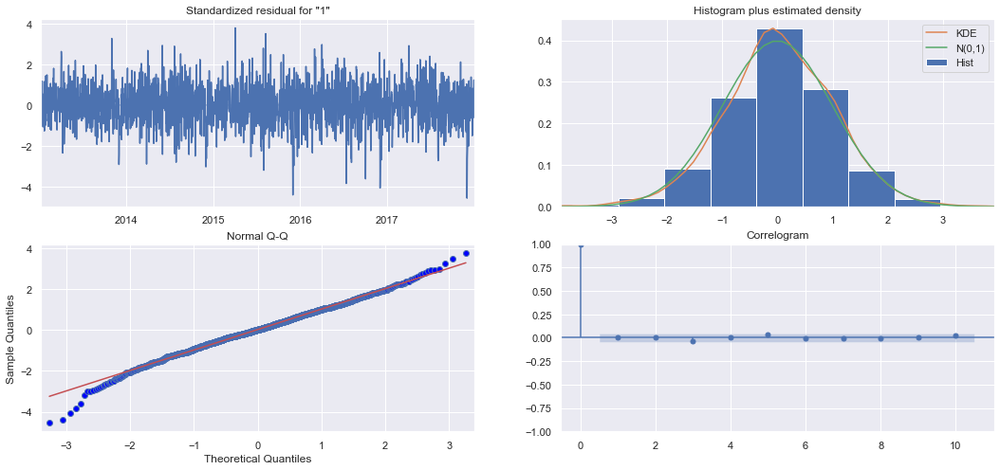

In [50]:
#set parameter range
p = range(0,3)
q = range(1,3)
d = range(0,2)
s = range(7,8)

# list of all parameter combos
pdq = list(itertools.product(p, d, q))
seasonal_pdq = list(itertools.product(p, d, q, s))

# SARIMA model pipeline

best_aic, best_param,best_param_seasonal = float("inf"), None, None
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = SARIMAX(y, order=param, seasonal_order=param_seasonal)
            results = mod.fit(max_iter = 50, method = 'powell')
            if results.aic < best_aic:
                best_results = results
                best_param,best_param_seasonal,best_aic = param, param_seasonal,results.aic
            
            print('SARIMA{},{} - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue
print('Best SARIMA{},{} - AIC:{}'.format(best_param, best_param_seasonal, best_aic))

best_results.plot_diagnostics(figsize=(18, 8))
plt.show()

##### Item 1 series - Best SARIMA(1, 0, 1),(2, 1, 1, 7) - AIC:14989.189885547472


#### Walk forward validation and MAPE calculation

In [51]:
# optimal model
mod = SARIMAX(y, order=(1, 0, 1), 
              seasonal_order=(2, 1, 1, 7), 
              enforce_stationarity=False, 
              enforce_invertibility=False)

results = mod.fit()
print(results.summary().tables[1])

C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9892      0.004    267.792      0.000       0.982       0.996
ma.L1         -0.7121      0.015    -46.024      0.000      -0.742      -0.682
ar.S.L7        0.0931      0.024      3.915      0.000       0.047       0.140
ar.S.L14       0.0461      0.023      2.010      0.044       0.001       0.091
ma.S.L7       -0.9799      0.006   -163.551      0.000      -0.992      -0.968
sigma2       340.8812      9.762     34.919      0.000     321.748     360.015


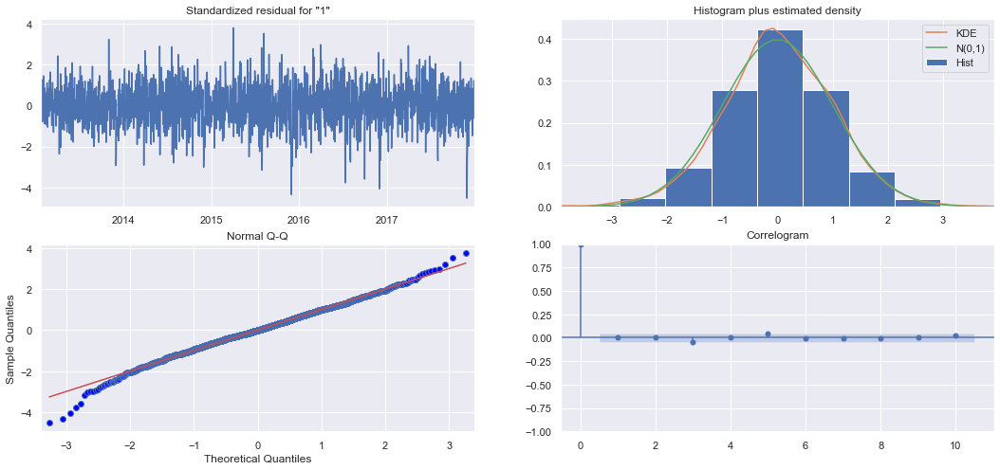

In [52]:
# plot results
results.plot_diagnostics(figsize=(18, 8))
plt.show()

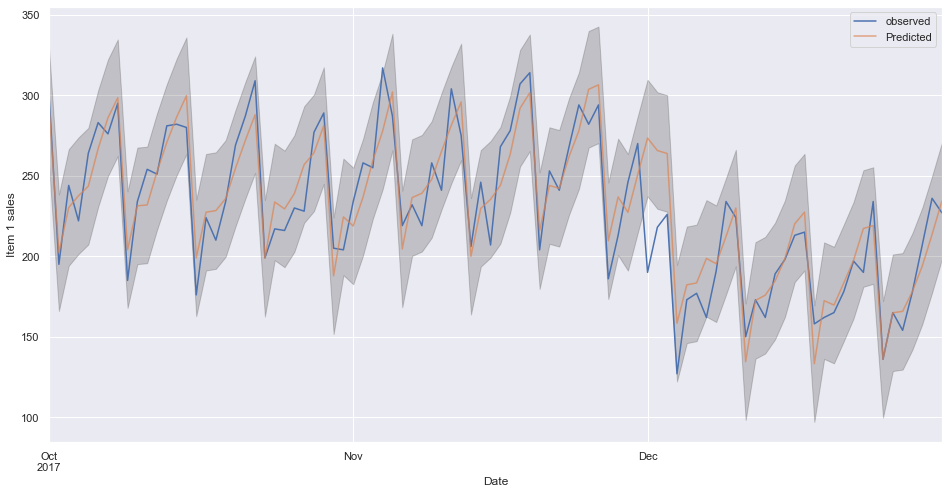

In [53]:
pred = results.get_prediction(start=pd.to_datetime('2017-10-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['2017-10-01':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='Predicted', alpha=.7, figsize=(16, 8))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Item 1 sales')
plt.legend()
plt.show()

##### Model performance - RMSE


In [54]:
prediction_item1 = pred.predicted_mean
print(prediction_item1 )
rmse_sarima_item1 = sqrt(mean_squared_error(test['1'], prediction_item1))
print('RMSE of SARIMA on Item 1: %.3f' %rmse_sarima_item1)

2017-10-01    292.380152
2017-10-02    202.209767
2017-10-03    230.239330
2017-10-04    237.590768
2017-10-05    243.510959
                 ...    
2017-12-27    165.805082
2017-12-28    178.192618
2017-12-29    193.936361
2017-12-30    213.528931
2017-12-31    234.311598
Freq: D, Name: predicted_mean, Length: 92, dtype: float64
RMSE of SARIMA on Item 1: 19.141


#### RMSE of SARIMA on Item 1 (19.141) significantly lower compared to  RMSE_Item 1: 44.261 based on Persistance/Naive.
#### Implement SARIMA on all Items

In [55]:
# model each item individually

# create dataframes to store RMSE & Forecasts of each item
items_rmse_sarima = []
df_pred_sarima = pd.DataFrame()

# loop over all items
for c in train.columns:
    train_series = train[c]
    test_series = test[c]
    # define model
    model_sarima = SARIMAX(train_series, 
                            order=(1, 0, 1), 
                            seasonal_order=(2, 1, 1, 7), 
                            enforce_stationarity=False, 
                            enforce_invertibility=False)

    # fit model
    moel_sarima_fit = model_sarima.fit(disp=False)
        
    # forecast
    n_steps = len(test_series)
    forecast_item = moel_sarima_fit.forecast(n_steps)
    # report performance by item
    rmse_sarima_item = sqrt(mean_squared_error(test_series, forecast_item))
    print('RMSE_Item %s: %.3f' %(c,rmse_sarima_item))
    items_rmse_sarima.append(rmse_sarima_item)
    df_pred_sarima[c] = forecast_item

# store model results in DFs
df_rmse_sarima = pd.DataFrame(columns=['rmse_sarima'])
df_rmse_sarima['rmse_sarima'] = items_rmse_sarima

items = []
for i in range(1,51):
    items.append(i)
df_rmse_sarima['item'] = items
    
print(df_rmse_sarima.head())
    
df_pred_sarima['date'] = test.index
df_pred_sarima.set_index('date',inplace = True)
print(df_pred_sarima.head())

# report performance across all items
rmse_sarima = sqrt(mean_squared_error(test, df_pred_sarima))
print('RMSE SARIMA: %.3f' %rmse_sarima)

# save predictions & rmse
df_rmse_sarima.to_csv('df_rmse_sarima.csv', header=True)
df_pred_sarima.to_csv('df_pred_sarima.csv', header=True)  

#project.save_data(file_name = 'df_rmse_sarima.csv',data =df_rmse_sarima.to_csv(header=True), overwrite = True)
#project.save_data(file_name = 'df_pred_sarima.csv',data =df_pred_sarima.to_csv(header=True), overwrite = True)

C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 1: 39.444


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 2: 123.209


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 3: 67.864


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 4: 48.515


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 5: 32.414


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 6: 116.586


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 7: 109.123


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 8: 152.178


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 9: 99.607


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 10: 138.063


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 11: 119.842


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 12: 126.506


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 13: 160.386


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 14: 134.034


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 15: 170.193


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 16: 53.801


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 17: 58.123


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 18: 191.638


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 19: 102.519


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 20: 96.200


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 21: 78.249


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 22: 151.603


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 23: 62.101


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 24: 149.116


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 25: 148.412


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 26: 88.409


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 27: 46.421


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 28: 182.076


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 29: 136.368


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 30: 85.555


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 31: 122.934


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 32: 85.849


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 33: 138.603


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 34: 54.575


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 35: 127.828


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 36: 156.249


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 37: 58.831


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 38: 152.626


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 39: 88.022


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 40: 61.791


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 41: 45.530


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 42: 83.375


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 43: 105.789


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 44: 63.137


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 45: 190.547


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 46: 113.782


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 47: 43.465


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 48: 104.996


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 49: 63.934


C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\visha\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'


RMSE_Item 50: 129.662
   rmse_sarima  item
0    39.444136     1
1   123.209423     2
2    67.864043     3
3    48.515115     4
4    32.414244     5
                     1           2           3           4           5  \
date                                                                     
2017-10-01  292.697341  837.646572  499.246451  310.495307  251.410215   
2017-10-02  200.278220  539.513083  332.781370  214.679362  162.327536   
2017-10-03  230.439411  646.573461  385.431967  243.417398  193.719142   
2017-10-04  233.910638  653.039677  382.961978  245.591335  193.961156   
2017-10-05  244.283222  693.863457  409.676185  260.530775  208.559095   

                     6           7            8           9           10  ...  \
date                                                                      ...   
2017-10-01  835.929260  819.336303  1091.661477  722.098176  1031.986286  ...   
2017-10-02  552.708658  533.863400   718.819374  471.948958   665.846901  ...   
2017-10-0

### Compare performance - Persistance vs SARIMA

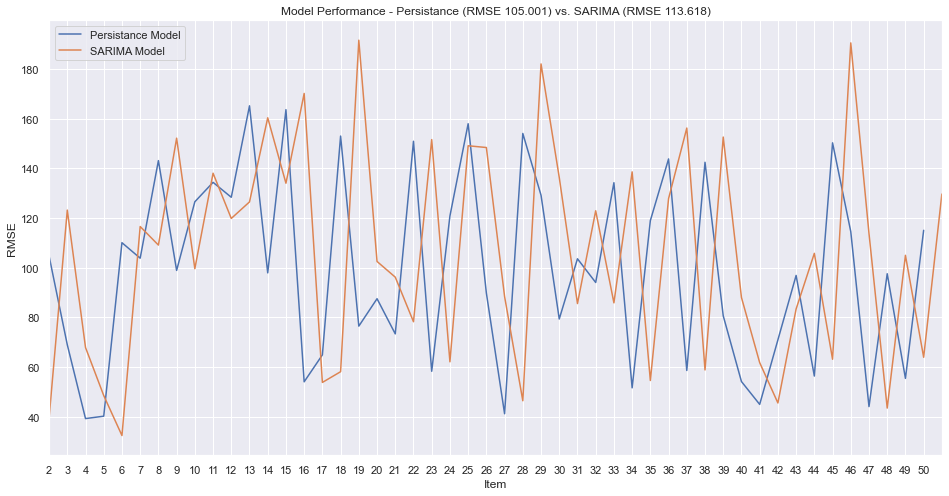

In [56]:
# plot item wise RMSE of Persiatace and SARIMA Models
fig, ax = plt.subplots(figsize=(16,8)) 
ax.plot(df_rmse_pers['item'],df_rmse_pers['rmse_pers'] , label='Persistance Model')
ax.plot(df_rmse_sarima['item'],df_rmse_sarima['rmse_sarima'] , label='SARIMA Model')
ax.set_xlabel('Item')
ax.set_ylabel('RMSE')
ax.set_title('Model Performance - Persistance (RMSE %0.3f) vs. SARIMA (RMSE %0.3f)' %(rmse_pers,rmse_sarima)) 
ax.legend()
ax.set_xlim(1,50)
ax.grid(True)

#### The RMSE plot indicates that the SARIMA model performance is very closely matches the Persistance Model performance